### KMEANS

#### 1. Define K-Elbow

In [ ]:
# Define K Manually

inertia = []
K = range(1,11)                                                                 
for i in K:                                                                      
    kmeanModel = KMeans(n_clusters=i, random_state=123)
    kmeanModel.fit(df_pca)
    inertia.append(kmeanModel.inertia_)
df_pca_inertia = pd.DataFrame({'Inertia':inertia}, index=[i for i in range(1,11)])
df_pca_inertia

,Inertia
1,5185.042626
2,3914.121538
3,3245.666850
4,2902.725163
5,2702.478076
6,2461.403861
7,2320.585957
8,2196.115016
9,2068.934125
10,1990.802438


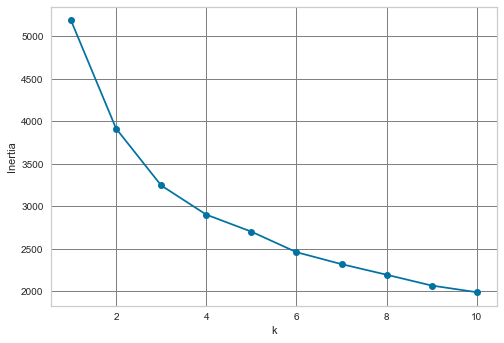

In [ ]:
# Plot K & Inertia

plt.plot(K, inertia, 'bo-')
plt.grid(color='gray')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.show()

**Detail** : Berdasarkan grafik inertia diatas, dapat ditetapkan bahwasanya *Knee* berada pada k = 4

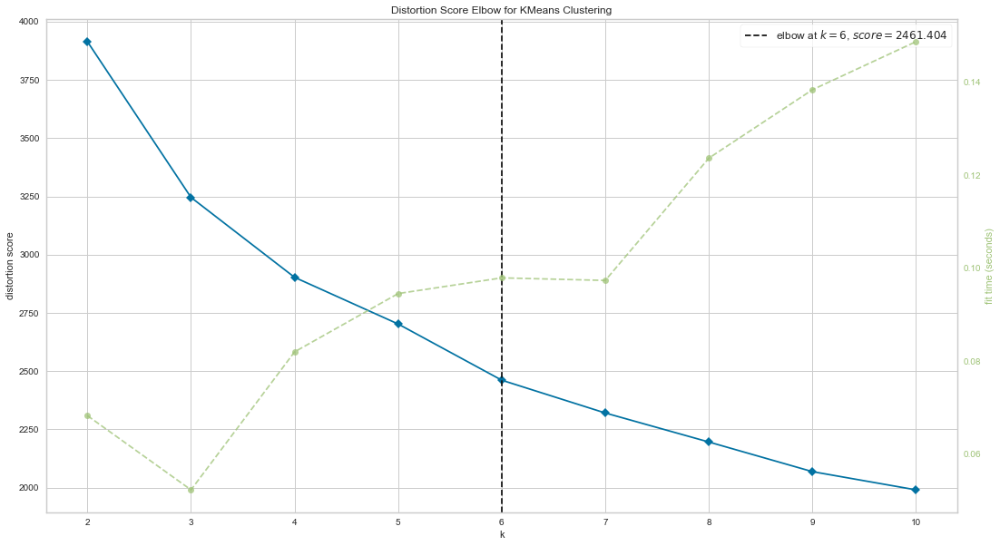

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Define K use elbow visualizer

plt.figure(figsize=(18,10))
elbow = KElbowVisualizer(KMeans(random_state=123), k=10)                                        # Gambarnya diperbesar
elbow.fit(df_pca)
elbow.show()

**Detail** : Berdasarkan grafik *Elbow visualizer* diatas, dapat ditetapkan bahwasanya *Knee* berada pada k = 6

Jadi, akan digunakan **k = 6** sebagai modeling K-Means

#### 2. Fitting Model

In [ ]:
# Fitting model with n = 6

model_km = KMeans(n_clusters=6, random_state=123)
result = model_km.fit_predict(df_pca)

result

array([4, 0, 4, ..., 4, 2, 5], dtype=int32)

In [ ]:
df_pca_kmeans = df_pca.copy()

In [ ]:
# Table cluster

df_pca_kmeans['Cluster Kmeans'] = result
df_pca_kmeans

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,Cluster Kmeans
0,-1.045429,-0.944165,0.745007,0.281666,0.195865,-0.201738,0.295645,-0.598952,-0.101336,0.055021,0.253822,-0.352725,4
1,-0.204632,1.324616,0.677443,-0.033203,-0.047611,-0.015479,-0.135507,0.073969,0.184915,-0.042745,0.057618,-0.058679,0
2,-0.977929,-0.650462,-0.446312,-0.150142,-0.152790,-0.339733,-0.145887,0.004122,-0.131479,0.028217,-0.075669,0.111794,4
3,-0.546301,0.513730,-0.356576,-0.322670,0.211170,-0.112467,-0.187174,0.041146,0.036247,-0.014539,-0.034597,0.045687,1
4,1.262197,-0.358782,-0.406917,-0.179089,-0.264606,0.213665,0.278634,-0.197553,0.000218,0.049378,0.045458,0.108939,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,-0.650014,0.146596,-0.371776,0.329850,-0.211571,-0.178115,0.071783,-0.027761,0.004770,-0.051957,0.089937,-0.417817,1
2236,1.963962,1.209512,-0.259447,0.939609,-0.104194,0.163155,0.008754,0.143317,0.574515,0.641018,-0.380544,-0.084632,5
2237,-0.990307,-0.793534,0.520811,0.082560,-0.523273,0.652495,-0.377982,0.131201,-0.702547,0.128974,0.101623,0.161600,4
2238,0.302062,-0.202017,-0.391382,0.237177,-0.193472,-0.492599,-0.215324,0.063777,-0.033955,-0.004407,-0.059635,0.067929,2


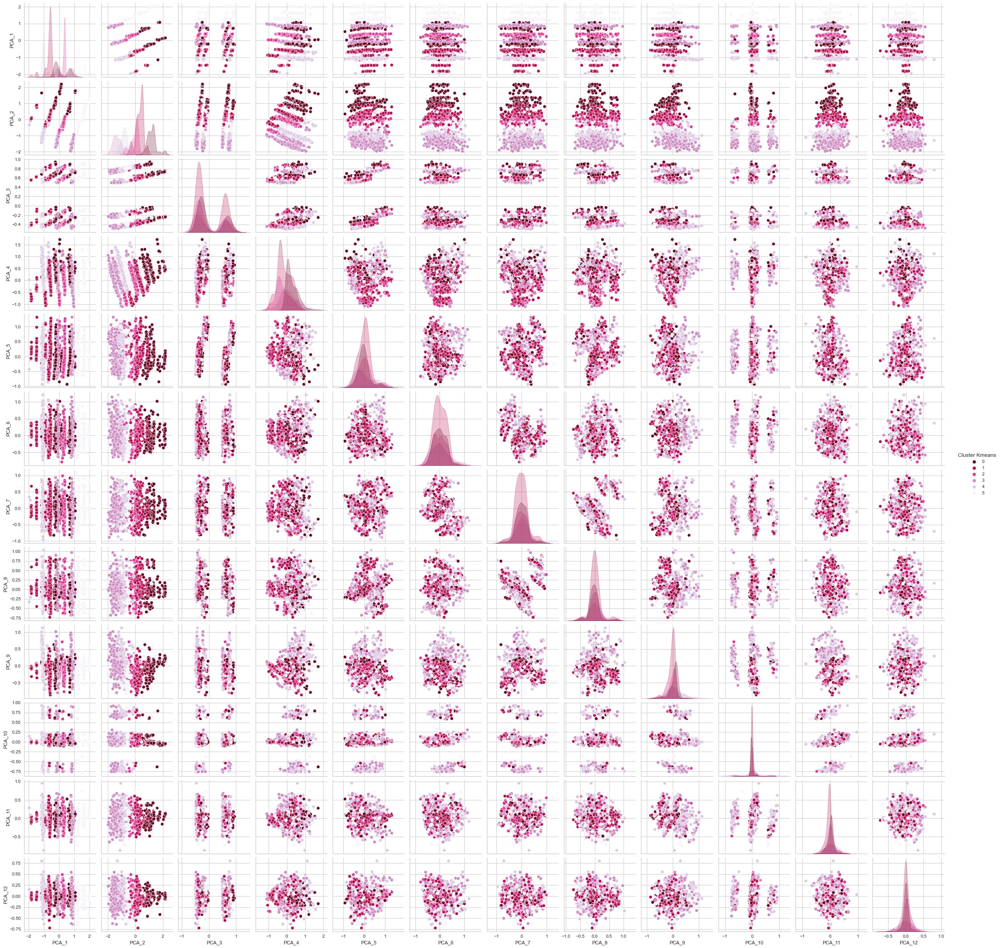

In [ ]:
# Plot data after KMeans

sns.pairplot(df_pca_kmeans, hue = 'Cluster Kmeans', palette='PuRd_r')

In [ ]:
# Detail Cluster

Kmeans_clust_sizes = df_pca_kmeans.groupby('Cluster Kmeans').size().to_frame()
Kmeans_clust_sizes.columns = ["KMeans_size"]
Kmeans_clust_sizes

,KMeans_size
Cluster Kmeans,
0,357
1,669
2,315
3,264
4,283
5,352


**Detail** : Dari jumlah cluster dan detail diatas, dapat dikatakan bahwa cluster yang terbentuk cukup memiliki size yang cukup merata pada cluster tersebut, hanya saja cluster 1 memiliki jumlah yang jauh berbeda dengan yang lain.

perlu diperdalam lagi terkait dengan size yang cukup berbeda

### DBSCAN

#### 1. Define eps_values & min samples

In [ ]:
# Investigating eps val & minsamples

from itertools import product

eps_values = np.arange(0.25,1.5,0.2) # eps values to be investigated            # Random choose
min_samples = np.arange(12,25) # min_samples values to be investigated          # Min samples should be >= Data dimension
DBSCAN_params = list(product(eps_values, min_samples))

In [ ]:
# Find number of cluster varian

no_of_clusters = []
sil_score = []

for p in DBSCAN_params:
    DBS_clustering = DBSCAN(eps=p[0], min_samples=p[1]).fit(df_pca)
    no_of_clusters.append(len(np.unique(DBS_clustering.labels_)))
    sil_score.append(silhouette_score(df_pca, DBS_clustering.labels_))



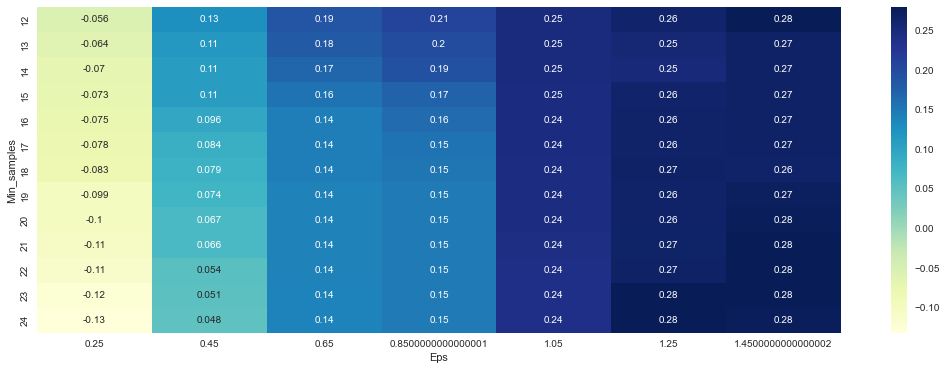

In [ ]:
# Plot Var                                                                      

tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['Sil_score'] = sil_score

pivot_1 = pd.pivot_table(tmp, values='Sil_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()


**Detail** : Dari heatmap diatas, nilai silhouette score terbaik ada pada 0.28, yaitu epsilon 1.25 dan 1.45 dan min samples 20-24.

Jadi epsilon dan minsamples yang digunakan adalah epsilon terkecil dan minsample terbesar dengan silhouetter score terbaik yaitu eps : 1.25 & minsamples : 24

#### 2. Fitting Model

In [ ]:
# eps = 1.25 , min_samples 24

model_dbsc_1 = DBSCAN(eps=1.25, min_samples=24).fit(df_pca)                     # semakin kecil eps & min samples, n cluster semakin banyak
labels_a = model_dbsc_1.labels_
print('Cluster yang terbentuk : ', pd.unique(labels_a))
print(labels_a)

Cluster yang terbentuk :  [ 0 -1]
[0 0 0 ... 0 0 0]


**Detail** : Dikarenakan hasil menunjukan hanya ada 2 cluster dan salah satunya outlier. maka kita coba dengan nilai epsilon dan min samples yang lain

In [ ]:
# eps = 1 , min_samples 13

model_dbsc_2 = DBSCAN(eps=1, min_samples=13).fit(df_pca)
labels_b = model_dbsc_2.labels_
print('Cluster yang terbentuk : ', pd.unique(labels_b))
print(labels_b)

Cluster yang terbentuk :  [ 0 -1  1  2]
[ 0  0  0 ... -1  0  0]


**Detail** : dengan epsilon dan min samples diatas, dihasilkan 4 cluster dengan salah satunya outlier. dimana jika dilihat dari heatmap memiliki sihouette score = 0.25

In [ ]:
df_pca_dbscan = df_pca.copy()

In [ ]:
# Table cluster

df_pca_dbscan['Cluster DBSCAN'] = labels_b
df_pca_dbscan

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,Cluster DBSCAN
0,-1.045429,-0.944165,0.745007,0.281666,0.195865,-0.201738,0.295645,-0.598952,-0.101336,0.055021,0.253822,-0.352725,0
1,-0.204632,1.324616,0.677443,-0.033203,-0.047611,-0.015479,-0.135507,0.073969,0.184915,-0.042745,0.057618,-0.058679,0
2,-0.977929,-0.650462,-0.446312,-0.150142,-0.152790,-0.339733,-0.145887,0.004122,-0.131479,0.028217,-0.075669,0.111794,0
3,-0.546301,0.513730,-0.356576,-0.322670,0.211170,-0.112467,-0.187174,0.041146,0.036247,-0.014539,-0.034597,0.045687,0
4,1.262197,-0.358782,-0.406917,-0.179089,-0.264606,0.213665,0.278634,-0.197553,0.000218,0.049378,0.045458,0.108939,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,-0.650014,0.146596,-0.371776,0.329850,-0.211571,-0.178115,0.071783,-0.027761,0.004770,-0.051957,0.089937,-0.417817,0
2236,1.963962,1.209512,-0.259447,0.939609,-0.104194,0.163155,0.008754,0.143317,0.574515,0.641018,-0.380544,-0.084632,-1
2237,-0.990307,-0.793534,0.520811,0.082560,-0.523273,0.652495,-0.377982,0.131201,-0.702547,0.128974,0.101623,0.161600,-1
2238,0.302062,-0.202017,-0.391382,0.237177,-0.193472,-0.492599,-0.215324,0.063777,-0.033955,-0.004407,-0.059635,0.067929,0


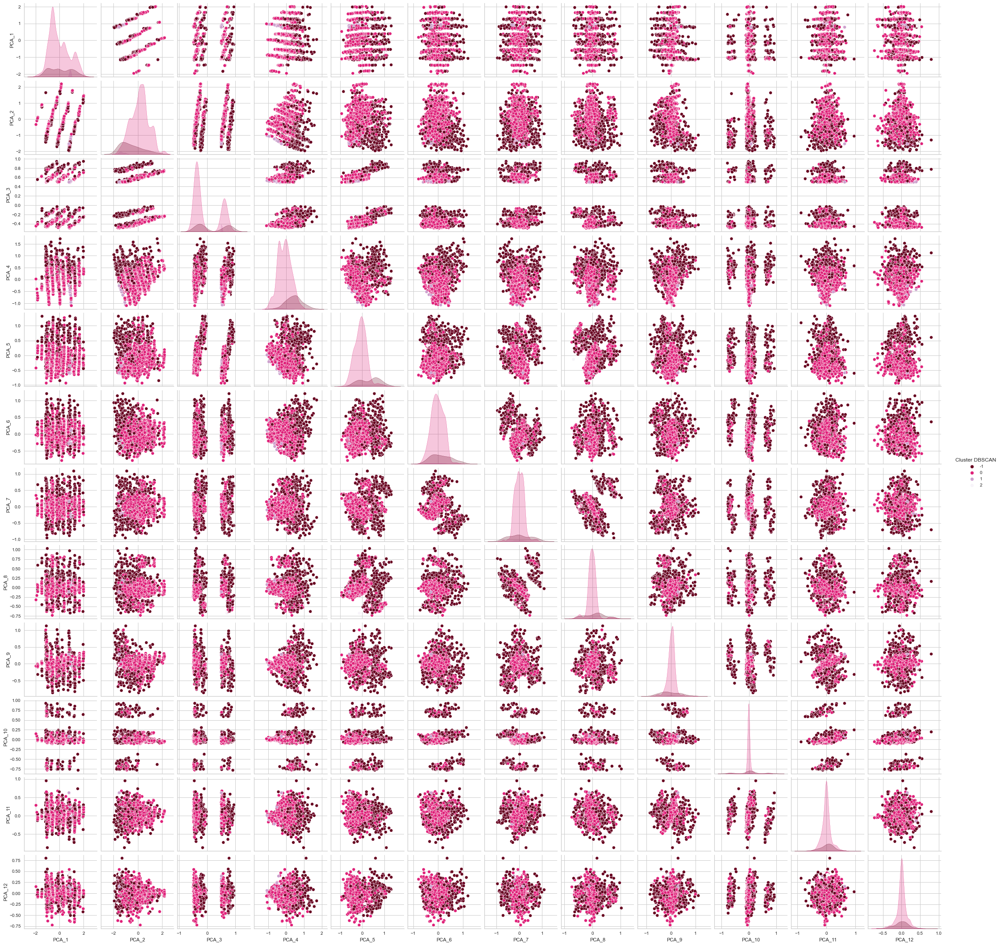

In [ ]:
# Plot data after DBSCAN

sns.pairplot(df_pca_dbscan, hue = 'Cluster DBSCAN', palette='PuRd_r')

In [ ]:
# Detail Cluster

DBSCAN_clust_sizes = df_pca_dbscan.groupby('Cluster DBSCAN').size().to_frame()
DBSCAN_clust_sizes.columns = ["DBSCAN_size"]
DBSCAN_clust_sizes

,DBSCAN_size
Cluster DBSCAN,
-1,404
0,1803
1,19
2,14


**Detail** : Dari size cluster diatas didapatkan 3 cluster dengan cluster 0 memiliki jumlah yang jauh lebih banyak dari cluster lainnya. Dimana terdapat teori bahwa Kepadatan di semua cluster seharusnya adalah sama.

Hal ini perlu dicek lebih lanjut

### HC (Hierarchical Clustering)

**Metode Aglomerative**

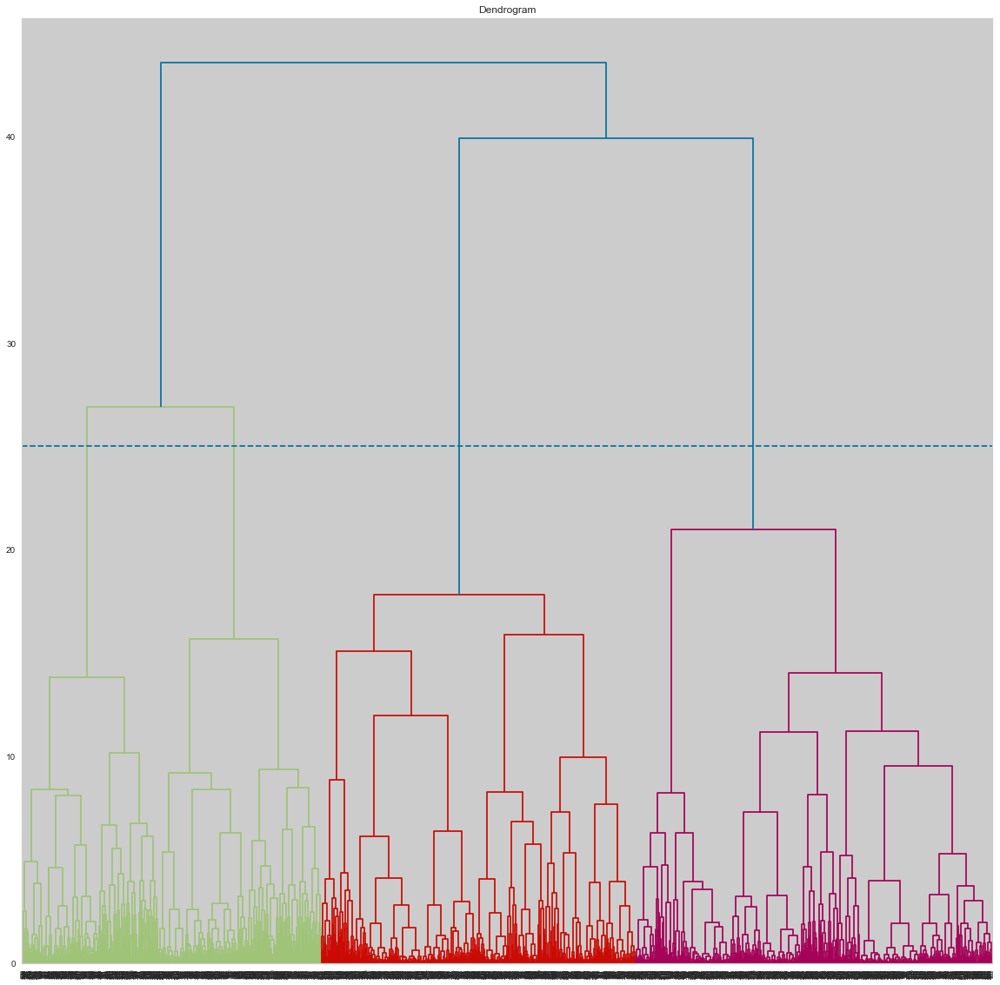

In [ ]:
plt.figure(figsize=(20,20))
plt.title('Dendrogram')
plt.axhline(y=200, linestyle='--')
dend = sch.dendrogram(sch.linkage(df_pca.iloc[:, :], method='ward'))
#plt.axhline(y=30, color='r', linestyle='--')                                   
plt.axhline(y=25, color='b', linestyle='--')

In [ ]:
modelAC = AC(n_clusters=4)
modelAC = modelAC.fit_predict(df_pca)

print('Cluster yang terbentuk : ', pd.unique(modelAC))
print(modelAC)

Cluster yang terbentuk :  [1 0 2 3]
[1 0 1 ... 1 2 2]


In [ ]:
df_pca_hc = df_pca.copy()

In [ ]:
# Table cluster

df_pca_hc['Cluster HC'] = modelAC
df_pca_hc

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,Cluster HC
0,-1.045429,-0.944165,0.745007,0.281666,0.195865,-0.201738,0.295645,-0.598952,-0.101336,0.055021,0.253822,-0.352725,1
1,-0.204632,1.324616,0.677443,-0.033203,-0.047611,-0.015479,-0.135507,0.073969,0.184915,-0.042745,0.057618,-0.058679,0
2,-0.977929,-0.650462,-0.446312,-0.150142,-0.152790,-0.339733,-0.145887,0.004122,-0.131479,0.028217,-0.075669,0.111794,1
3,-0.546301,0.513730,-0.356576,-0.322670,0.211170,-0.112467,-0.187174,0.041146,0.036247,-0.014539,-0.034597,0.045687,0
4,1.262197,-0.358782,-0.406917,-0.179089,-0.264606,0.213665,0.278634,-0.197553,0.000218,0.049378,0.045458,0.108939,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,-0.650014,0.146596,-0.371776,0.329850,-0.211571,-0.178115,0.071783,-0.027761,0.004770,-0.051957,0.089937,-0.417817,0
2236,1.963962,1.209512,-0.259447,0.939609,-0.104194,0.163155,0.008754,0.143317,0.574515,0.641018,-0.380544,-0.084632,2
2237,-0.990307,-0.793534,0.520811,0.082560,-0.523273,0.652495,-0.377982,0.131201,-0.702547,0.128974,0.101623,0.161600,1
2238,0.302062,-0.202017,-0.391382,0.237177,-0.193472,-0.492599,-0.215324,0.063777,-0.033955,-0.004407,-0.059635,0.067929,2


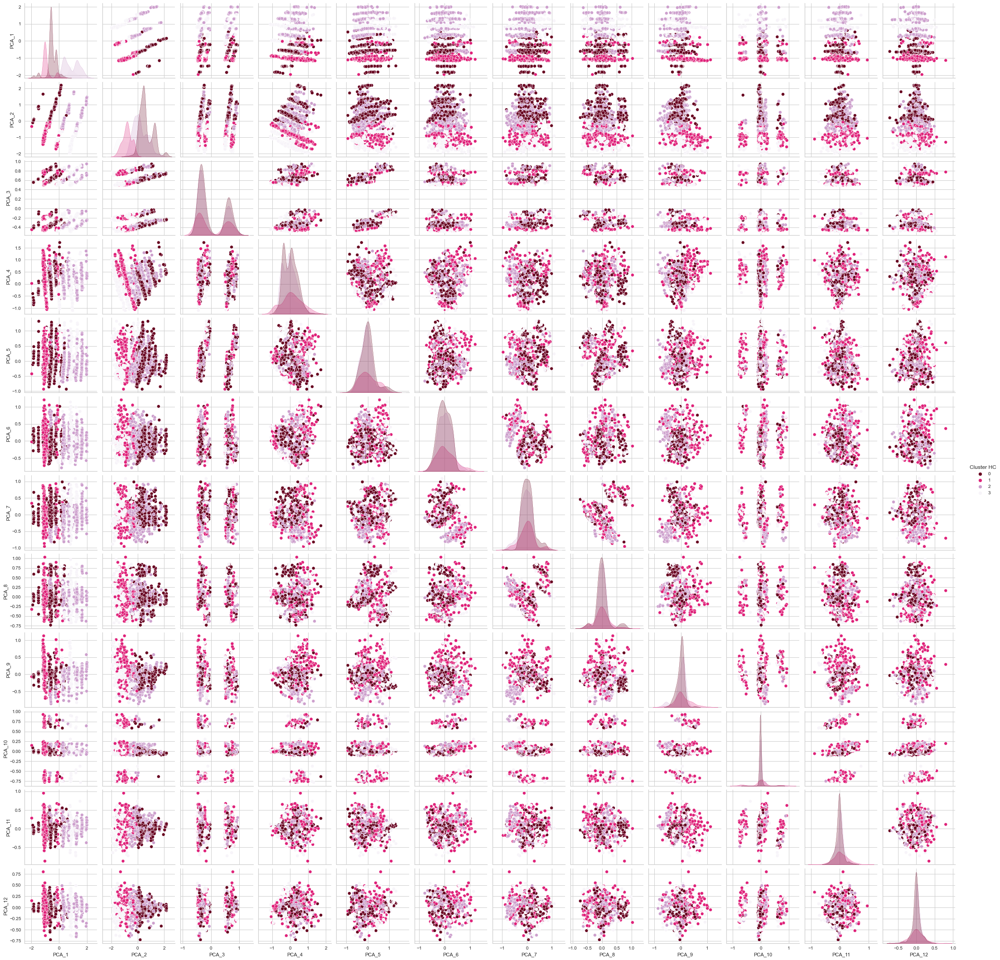

In [ ]:
# Plot data after HC

sns.pairplot(df_pca_hc, hue = 'Cluster HC', palette='PuRd_r')

In [ ]:
# Detail Cluster

HC_clust_sizes = df_pca_hc.groupby('Cluster HC').size().to_frame()
HC_clust_sizes.columns = ["HC_size"]
HC_clust_sizes

,HC_size
Cluster HC,
0,825
1,377
2,724
3,314


**Detail** : Dari jumlah cluster dan detail diatas, dapat dikatakan bahwa cluster yang terbentuk cukup memiliki size yang cukup jauh antara cluster 0-2 dan cluster 1-3. Dari size diatas hampir sama dengan size pada Kmeans

perlu diperdalam lagi terkait dengan size yang cukup berbeda

### Evaluation Metrics

In [ ]:
data.iloc[:, :]

,Education,Marital_Status,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Children,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Age,Total_Amount,Total_Purchase,Cluster_KM,Cluster_DB,Cluster_HC
0,1,1,0,0,0,0,0,0,1,0,0.084832,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,0.200000,0.296296,0.357143,0.307692,0.35,0.378641,0.639683,0.68750,4,0,1
1,1,1,0,0,0,0,0,0,0,2,0.067095,0.383838,0.007368,0.005025,0.003478,0.007722,0.003802,0.016575,0.133333,0.037037,0.035714,0.153846,0.25,0.407767,0.008730,0.12500,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0.105097,0.262626,0.285332,0.246231,0.073623,0.428571,0.079848,0.116022,0.066667,0.296296,0.071429,0.769231,0.20,0.300971,0.305952,0.62500,4,0,1
3,1,0,0,0,0,0,0,0,0,1,0.037471,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,0.133333,0.074074,0.000000,0.307692,0.30,0.116505,0.019048,0.18750,1,0,0
4,3,0,0,0,0,0,0,0,0,1,0.085065,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,0.333333,0.185185,0.107143,0.461538,0.25,0.145631,0.165476,0.43750,5,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1,0,0,0,0,0,0,0,0,1,0.089472,0.464646,0.474883,0.216080,0.105507,0.162162,0.448669,0.682320,0.133333,0.333333,0.107143,0.307692,0.25,0.281553,0.530159,0.50000,1,0,0
2236,3,0,0,0,0,1,0,0,0,3,0.093669,0.565657,0.271936,0.000000,0.017391,0.000000,0.000000,0.022099,0.466667,0.296296,0.071429,0.384615,0.35,0.485437,0.174206,0.46875,5,-1,2
2237,1,1,0,1,0,0,0,0,0,0,0.083092,0.919192,0.608171,0.241206,0.125797,0.123552,0.045627,0.066298,0.066667,0.074074,0.107143,1.000000,0.30,0.145631,0.490476,0.56250,4,-1,1
2238,2,0,0,0,0,0,0,0,0,1,0.101536,0.080808,0.286671,0.150754,0.124058,0.308880,0.114068,0.168508,0.133333,0.222222,0.178571,0.769231,0.15,0.388350,0.332540,0.65625,2,0,2


In [ ]:
siluet_km = silhouette_score(data.iloc[:, :], data['Cluster_KM'])
calinski_km = calinski_harabasz_score(data.iloc[:, :], data['Cluster_KM'])
dbi_km = davies_bouldin_score(data.iloc[:, :], data['Cluster_KM'])

siluet_db = silhouette_score(data.iloc[:, :], data['Cluster_DB'])
calinski_db = calinski_harabasz_score(data.iloc[:, :], data['Cluster_DB'])
dbi_db = davies_bouldin_score(data.iloc[:, :], data['Cluster_DB'])

siluet_ac = silhouette_score(data.iloc[:, :], data['Cluster_HC'])
calinski_ac = calinski_harabasz_score(data.iloc[:, :], data['Cluster_HC'])
dbi_ac = davies_bouldin_score(data.iloc[:, :], data['Cluster_HC'])

compare_model = pd.DataFrame({'KMeans': [siluet_km, calinski_km, dbi_km],
                             'DBScan': [siluet_db, calinski_db, dbi_db],
                             'Agglomerative': [siluet_ac, calinski_ac, dbi_ac]},
                            index=['Silhouette Score', 'Calinski Harabasz Score', 'Davies Bouldin Score'])
compare_model

,KMeans,DBScan,Agglomerative
Silhouette Score,0.348996,0.071960,0.281628
Calinski Harabasz Score,1262.223290,78.424524,742.751226
Davies Bouldin Score,1.372751,1.858658,1.857898


KMeans is the better model than DBSCAN & HC Agglomerative